# PDX Tumors from Ben Drapkin


In [2]:
import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import numpy as np
import dropkick as dk
import sys
sys.path.insert(1, "/Users/smgroves/Dropbox (VU Basic Sciences)/pycharm_workspace/mazebox/")

import mazebox as mb

In [3]:
adata = sc.read_h5ad('adata03_dk.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 928 × 11490
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'timepoints', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'leiden', 'S_score', 'G2M_score', 'phase', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-3A2', 'dropkick_coef-B3', 'gene_count_corr', 'velocity_gamma_B3', 'velocity_r2_B3', 'velocity_genes_B3', 'velocity_gamma_3A2', 'velocity_r2_3A2', 'velocity_genes_3A2'
    uns: 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'phase_colors', 'timepoints_colors', 'umap', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'velo

In [6]:
fname = '1518'
clusters = 'leiden'
tfs = ['SP100', 'FOSL1', 'HES1', 'NFKBIZ', 'RELB', 'EPAS1', 'BCL3', 'REST', 'SP110', 'NFKB2', 'TEAD2', 'HMG20B', 'SIX5',
       'RARG', 'TEAD4', 'ZNF217', 'SP140L', 'SOX18', 'HOXC13', 'STAT6', 'ETV4', 'KLF2', 'MITF', 'NR0B2', 'ASCL1', 'ZBTB7C', 'ELF3',
       'RORC', 'FOXA2', 'ETS2','TOX3', 'XBP1', 'ST18', 'FOXA1', 'OVOL2', 'ZNF664', 'TBX10', 'PROX1', 'ETV6', 'CEBPD', 'TFCP2L1', 'FOXJ3',
       'ZNF407', 'ZNF511','ZNF396', 'RBPJ', 'ZSCAN31', 'HOXB5', 'ZNF3', 'TSHZ2', 'ZBTB16', 'ZNF10', 'FLI1', 'GATA4', 'NR0B1', 'NHLH1',
       'NEUROD6', 'ZNF581', 'TCF15', 'LYAR', 'ISL2', 'OLIG2', 'NEUROD1', 'INSM1', 'PAX5', 'SP6', 'MYT1', 'HES6', 'ZNF24', 'ISL1', 'ZNF397',
       'SOX11', 'ZNF253', 'SMAD4', 'RBP1', 'ONECUT2', 'ZNF711', 'DLX5', 'GRIP1', 'ZNF157', 'ZNF713', 'ZNF136', 'FOXN4', 'PATZ1', 'ZNF491',
       'ZBTB21', 'KLF12', 'ZNF501', 'ZNF785', 'CXXC1', 'ZNF324', 'ZNF764', 'ZBTB18', 'KAT8', 'ZNF334', 'POU4F1', 'ZNF250', 'ZNF132',
       'SALL2', 'DLX6', 'MBD1','SOX1', 'ZFP3', 'ZNF543', 'POU2F1', 'NONO', 'SMAD9', 'ZKSCAN2', 'TCF12', 'VEZF1', 'TOX', 'BHLHE22', 'MTA1',
       'TCF3', 'SCRT2', 'RFX7','NHLH2', 'SCRT1', 'RCOR2', 'PURG', 'TBPL1', 'TCF4', 'EBF1', 'ZNF749', 'NEUROD2', 'ZNF423', 'BACH2', 'GLI1',
       'ZFP64','NKX2-1', 'MYC', 'YAP1', 'POU2F3', 'MYCL', 'MYCN', 'ASCL2', 'AVIL', 'CHAT', 'GFI1B',
      'CHGA','EPCAM']
genes = sorted(list(set(tfs).intersection(set(adata.var_names))))
adata.layers['t0'] = adata.layers['Ms']
adata.layers['t1'] = scv.utils.get_extrapolated_state(adata)

t0 = pd.DataFrame(adata[:, genes].layers['t0'], index=adata.obs_names, columns=genes)
t0.to_csv(f'../out/t0_{fname}.csv')
print(t0.head())
t1 = pd.DataFrame(adata[:, genes].layers['t1'], index=adata.obs_names, columns=genes)
t1.to_csv(f'../out/t1_{fname}.csv')
print(t1.head())
network_clusters = pd.DataFrame(adata.obs[clusters])
network_clusters.to_csv(f'../out/{fname}_clusters.csv')


                                     ASCL1  AVIL   BHLHE22     CEBPD  \
MGH1518-3A2:AAATGCCTCTTCATGTx-B3  0.219034   0.0  0.000000  0.000000   
MGH1518-3A2:AAAGCAAAGAGCTTCTx-B3  0.186980   0.0  0.032851  0.027722   
MGH1518-3A2:AAAGTAGTCTCGTTTAx-B3  0.119331   0.0  0.000000  0.000000   
MGH1518-3A2:AAAGATGAGACTAGATx-B3  0.294217   0.0  0.000000  0.000000   
MGH1518-3A2:AAAGCAATCGATAGAAx-B3  0.134348   0.0  0.036575  0.000000   

                                      CHGA     CXXC1      DLX5      DLX6  \
MGH1518-3A2:AAATGCCTCTTCATGTx-B3  0.037412  0.048725  0.116107  0.081567   
MGH1518-3A2:AAAGCAAAGAGCTTCTx-B3  0.013861  0.045630  0.019327  0.090446   
MGH1518-3A2:AAAGTAGTCTCGTTTAx-B3  0.000000  0.036212  0.024940  0.097666   
MGH1518-3A2:AAAGATGAGACTAGATx-B3  0.031066  0.000000  0.056306  0.173911   
MGH1518-3A2:AAAGCAATCGATAGAAx-B3  0.017119  0.000000  0.018336  0.077084   

                                      EBF1      ELF3  ...    ZNF407  ZNF501  \
MGH1518-3A2:AAATGCCTCTTCATGTx-B

In [52]:
network_clusters = pd.DataFrame(adata.obs['Phenotype'])
network_clusters.to_csv(f'../out/{fname}_phenotype.csv')

# Preprocessing

## Read in Files

In [6]:
sig_matrix = pd.read_csv('../../../data/sig_matrix_ParTI.csv', header =0, index_col = 0)
sig_matrix = sig_matrix / np.linalg.norm(sig_matrix, axis=0)

In [177]:
indir = "../Vito/data"

samples = ['MGH1518-3A2','MGH1518-B3']
[a1,a2] = [mb.pp.read_loom(sample, indir) for sample in samples]


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


## Filter and concatenate

In [178]:
tfs = ['SP100', 'FOSL1', 'HES1', 'NFKBIZ', 'RELB', 'EPAS1', 'BCL3', 'REST', 'SP110', 'NFKB2', 'TEAD2', 'HMG20B', 'SIX5',
       'RARG', 'TEAD4', 'ZNF217', 'SP140L', 'SOX18', 'HOXC13', 'STAT6', 'ETV4', 'KLF2', 'MITF', 'NR0B2', 'ASCL1', 'ZBTB7C', 'ELF3',
       'RORC', 'FOXA2', 'ETS2','TOX3', 'XBP1', 'ST18', 'FOXA1', 'OVOL2', 'ZNF664', 'TBX10', 'PROX1', 'ETV6', 'CEBPD', 'TFCP2L1', 'FOXJ3',
       'ZNF407', 'ZNF511','ZNF396', 'RBPJ', 'ZSCAN31', 'HOXB5', 'ZNF3', 'TSHZ2', 'ZBTB16', 'ZNF10', 'FLI1', 'GATA4', 'NR0B1', 'NHLH1',
       'NEUROD6', 'ZNF581', 'TCF15', 'LYAR', 'ISL2', 'OLIG2', 'NEUROD1', 'INSM1', 'PAX5', 'SP6', 'MYT1', 'HES6', 'ZNF24', 'ISL1', 'ZNF397',
       'SOX11', 'ZNF253', 'SMAD4', 'RBP1', 'ONECUT2', 'ZNF711', 'DLX5', 'GRIP1', 'ZNF157', 'ZNF713', 'ZNF136', 'FOXN4', 'PATZ1', 'ZNF491',
       'ZBTB21', 'KLF12', 'ZNF501', 'ZNF785', 'CXXC1', 'ZNF324', 'ZNF764', 'ZBTB18', 'KAT8', 'ZNF334', 'POU4F1', 'ZNF250', 'ZNF132',
       'SALL2', 'DLX6', 'MBD1','SOX1', 'ZFP3', 'ZNF543', 'POU2F1', 'NONO', 'SMAD9', 'ZKSCAN2', 'TCF12', 'VEZF1', 'TOX', 'BHLHE22', 'MTA1',
       'TCF3', 'SCRT2', 'RFX7','NHLH2', 'SCRT1', 'RCOR2', 'PURG', 'TBPL1', 'TCF4', 'EBF1', 'ZNF749', 'NEUROD2', 'ZNF423', 'BACH2', 'GLI1',
       'ZFP64','NKX2-1', 'MYC', 'YAP1', 'POU2F3', 'MYCL', 'MYCN', 'ASCL2', 'AVIL', 'CHAT', 'GFI1B',
      'CHGA','EPCAM']
genes = sig_matrix.index

In [179]:
batch_categories = ['B3','3A2']
batch_key = 'timepoints'

# adata = a1.concatenate(a2, batch_key='timepoints')
# mb.pp.scanpy_recipe(adata, retain_genes=tfs)
adatas = [a1,a2] 

def dropkick_filter(adata, verbose = False, plot = True):
    adata_rc = dk.dropkick(adata, n_jobs=4, verbose=verbose)
    if plot:
        dk.qc_summary(adata)
    adata = adata[(adata.obs.dropkick_label == 'True'), :].copy()
    return adata
adatas = [dropkick_filter(adata, verbose = False, plot = False) for adata in adatas]
a1 = adatas.pop(0)
adata = a1.concatenate(adatas, batch_key=batch_key, batch_categories=batch_categories)

#adata = mb.pp.dropkick_recipe(adatas, verbose=True, batch_categories = batch_categories, batch_key = batch_key,
 #                                               X_final = 'log1p_norm',plot=False,
  #                                              retain_genes=[i.capitalize() for i in tfs])

Chosen lambda value:
	[0.13991395]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.18649505]
Assigning scores and labels
Done!



In [188]:
adata

AnnData object with n_obs × n_vars = 928 × 11490
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'timepoints', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'leiden', 'S_score', 'G2M_score', 'phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-3A2', 'dropkick_coef-B3'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'phase_colors', 'timepoints_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

### Added in scanpy and scvelo filters to remove genes without counts of >100 and cells <3

In [181]:
sc.pp.filter_cells(adata, min_genes=50)
scv.pp.filter_genes(adata, min_counts=3, retain_genes=[i.capitalize() for i in tfs])
adata.obs.drop(columns=["n_genes"], inplace=True)

Filtered out 25111 genes that are detected 3 counts (spliced).


In [119]:
#mb.pp.scanorama_recipe(adata, correct = True)

In [182]:
sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [183]:
sc.tl.leiden(adata,0.6)

In [184]:
adata

AnnData object with n_obs × n_vars = 928 × 11490
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'timepoints', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-3A2', 'dropkick_coef-B3'
    uns: 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

## Cell Cycle Regression

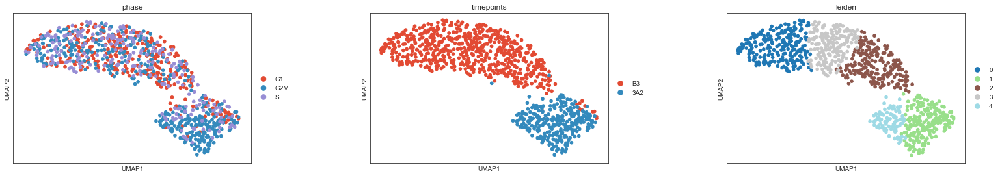

In [7]:
# scv.tl.score_genes_cell_cycle(adata)
sc.pl.scatter(adata, color=['phase','timepoints','leiden'], basis = 'umap')

In [186]:
adata

AnnData object with n_obs × n_vars = 928 × 11490
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'timepoints', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'leiden', 'S_score', 'G2M_score', 'phase'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-3A2', 'dropkick_coef-B3'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'phase_colors', 'timepoints_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

# Dimensionality Reduction and RNA Velocity

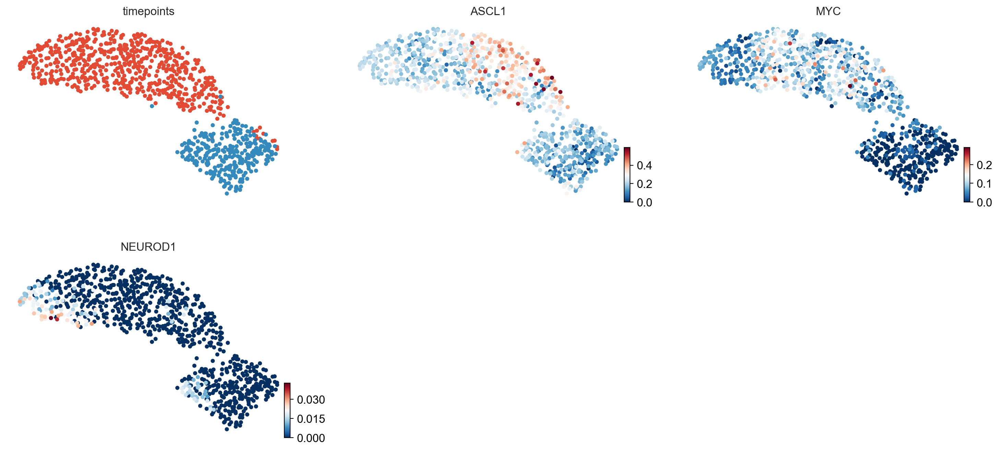

In [8]:
import matplotlib.pyplot as plt
scv.set_figure_params(frameon = False)
scv.pl.umap(adata, color = ['timepoints','ASCL1','MYC', 'NEUROD1'], ncols = 3, smooth = True)

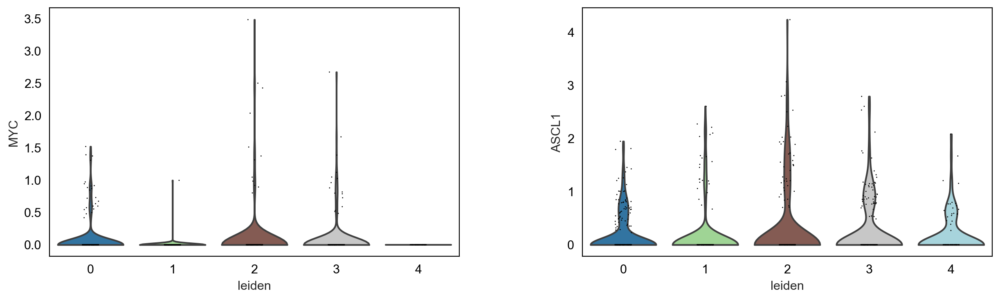

In [9]:
sc.pl.violin(adata, ['MYC', 'ASCL1'], groupby = 'leiden')

In [192]:
adata.write_h5ad('../adata01_dk.h5ad')

In [217]:
adata = sc.read_h5ad('../adata01_dk.h5ad')

## Calculating Velocity

In [218]:
scv.pp.moments(adata)
scv.tl.velocity(adata, mode = 'deterministic', groupby='timepoints')
scv.tl.velocity_graph(adata)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:20) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


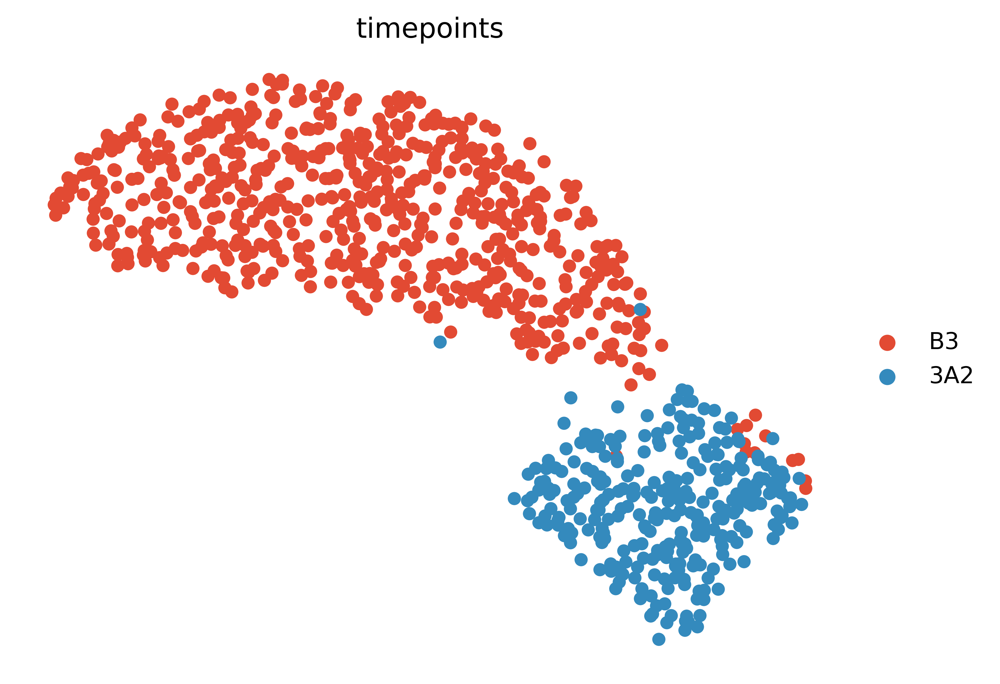

In [219]:
# sc.tl.tsne(adata, random_state=1)
sc.pl.umap(adata, color = 'timepoints')

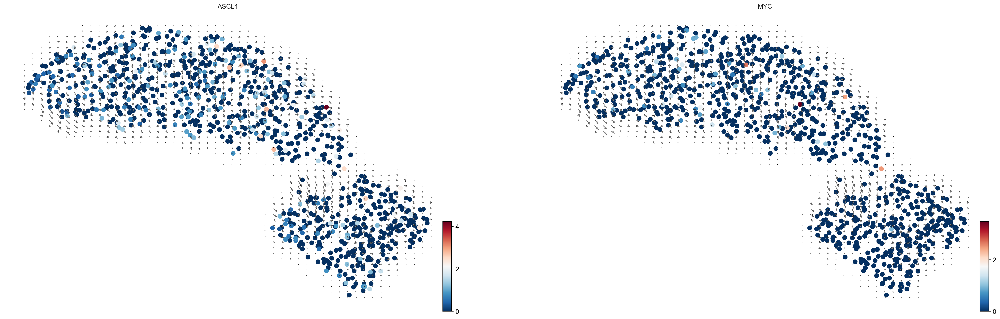

In [11]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap', color = ['ASCL1','MYC'], figsize = (16,10),alpha=1,
                                smooth =True)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


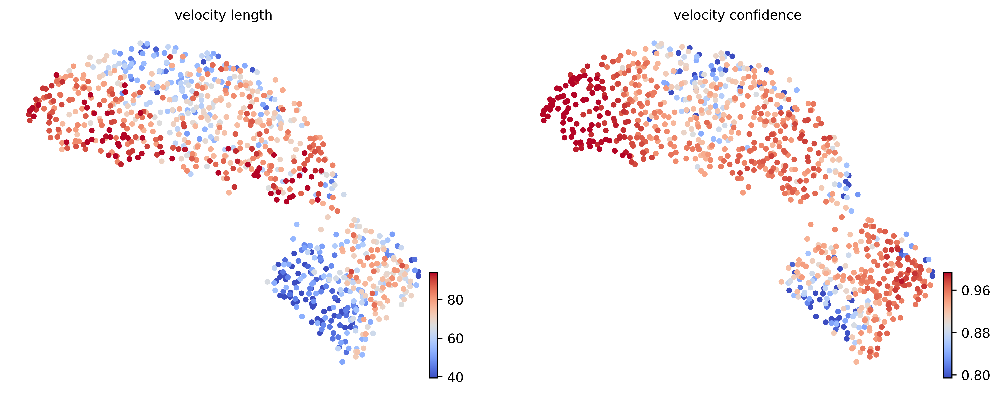

In [221]:
scv.tl.velocity_confidence(adata)

keys = 'velocity_length', 'velocity_confidence'  
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95], basis = 'umap')

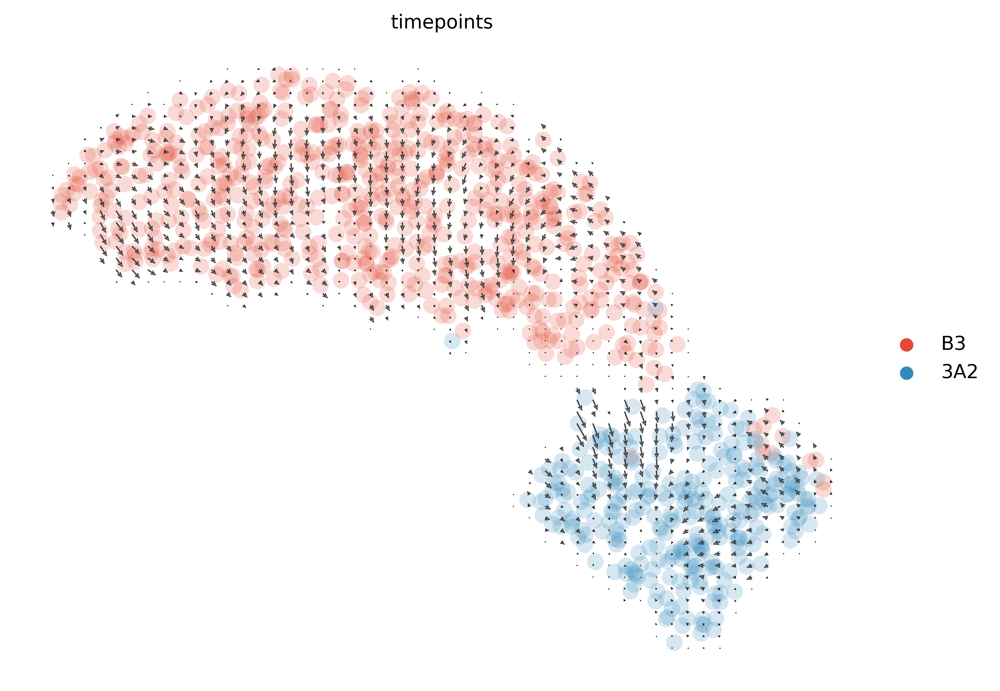

In [222]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap', figsize = (8,6), legend_loc = 'on right',color = 'timepoints')


In [66]:
adata.write_h5ad('../Vito/adata02_dk.h5ad')

In [68]:
adata = sc.read_h5ad('../Vito/adata02_dk.h5ad')

# Pseudotime and plasticity

We would like to see if we can get the same results as Ireland et al. did for their pseudotime analysis. To run Monocle2, we need the R interface `rpy2`. We'll also use the pseudotime inference within scvelo for comparison.

In [223]:
scv.tl.terminal_states(adata, groupby = 'timepoints')

computing terminal states
    identified 1 region of root cells and 1 region of end points  (B3).
    identified 1 region of root cells and 1 region of end points  (3A2).
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


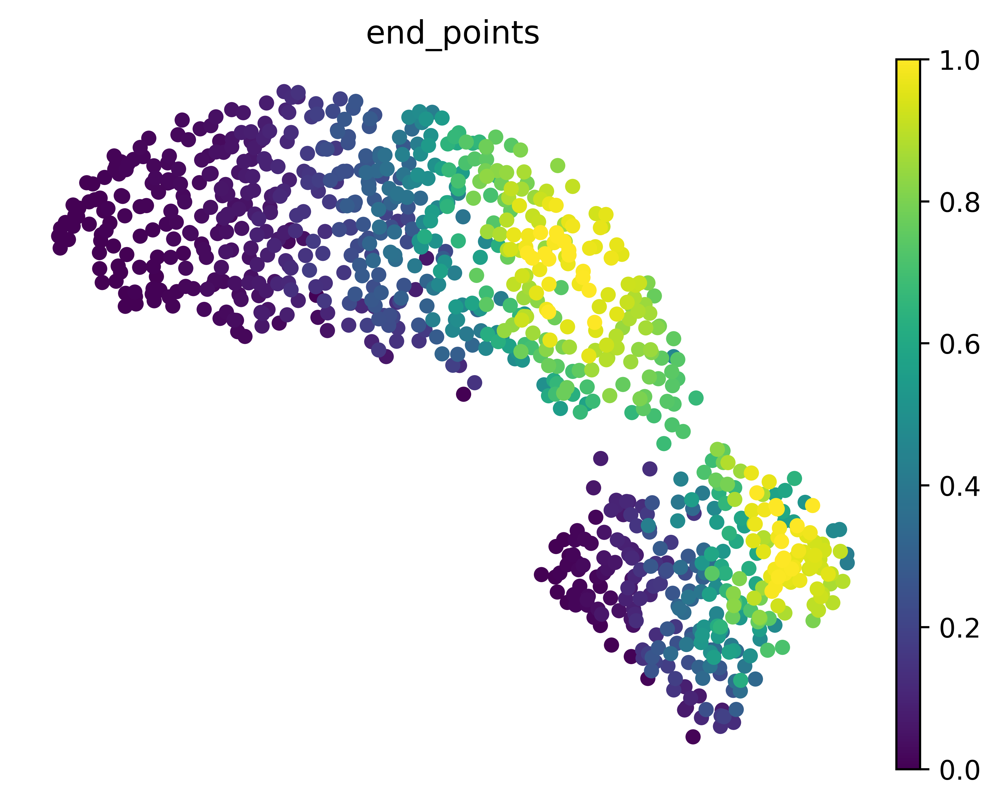

In [224]:
sc.pl.umap(adata, color="end_points")

### Velocity pseudotime

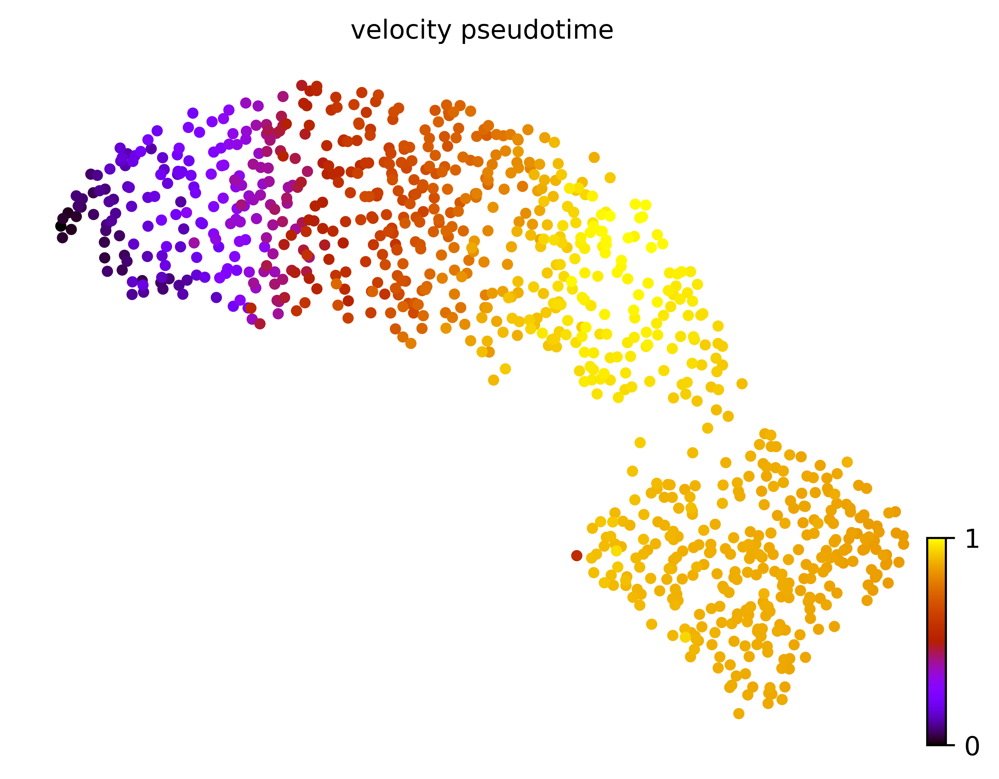

In [225]:
# Velocity pseudotime from scvelo
#scv.tl.terminal_states(adata)
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot', basis = 'umap')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


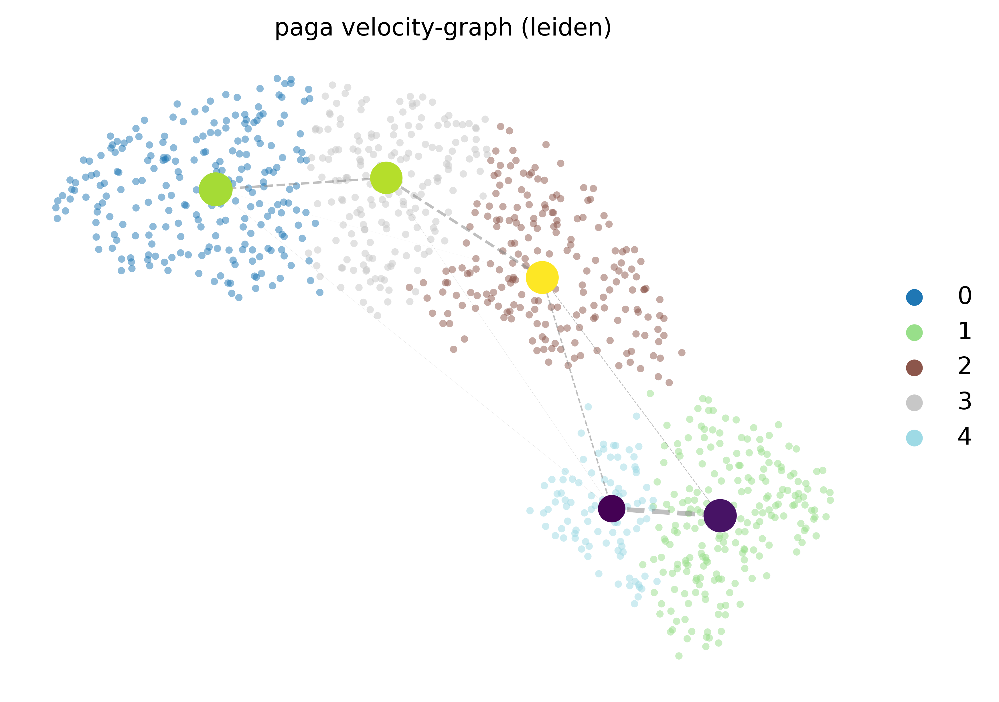

In [226]:
mb.ps.velocity_paga(adata, basis='umap', color='MYC')

In [227]:
adata.write_h5ad('../Vito/adata03_dk.h5ad')

In [3]:
adata = sc.read_h5ad('../int/adata03_dk.h5ad')

### Calculate plasticity using CTrP

In [38]:
scv.tl.recover_dynamics(adata)

recovering dynamics
    finished (0:02:41) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [ ]:
scv.tl.latent_time

In [72]:
adata.obs_vector

<bound method AnnData.obs_vector of AnnData object with n_obs × n_vars = 928 × 11490
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'timepoints', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'leiden', 'S_score', 'G2M_score', 'phase', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'SCLC-A_Score', 'SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-P_Score', 'SCLC-Y_Score', 'SCLC-A_Score_t1', 'SCLC-A2_Score_t1', 'SCLC-N_Score_t1', 'SCLC-P_Score_t1', 'SCLC-Y_Score_t1', 'Phenotype', 'MYC', 'MYC_expr', 'col', 'ctrp', 'absorbing'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-3A2', 'dropkick_coef-B3', 'gene_count_corr', 'velocity_gamma_B3', 'velocity_r2_B3', 'velocity_genes_B3', 'velocity_gamma_3A2', 'velocity_r2_3A2', 'velocity_genes_3A2', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma'

Text(0.5, 0, 'ASCL1')

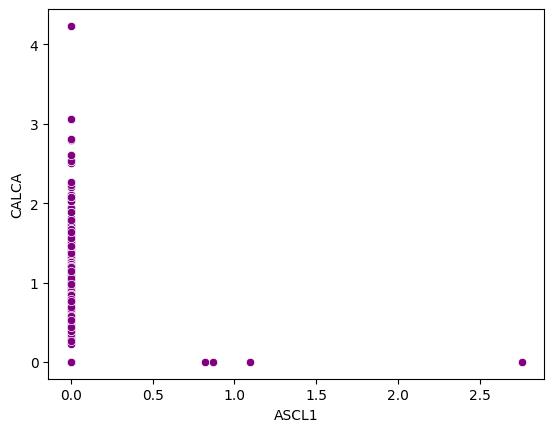

In [85]:

sns.scatterplot(x = adata.obs_vector('CALCA'), y = adata.obs_vector("ASCL1"))
plt.ylabel('CALCA')
plt.xlabel('ASCL1')




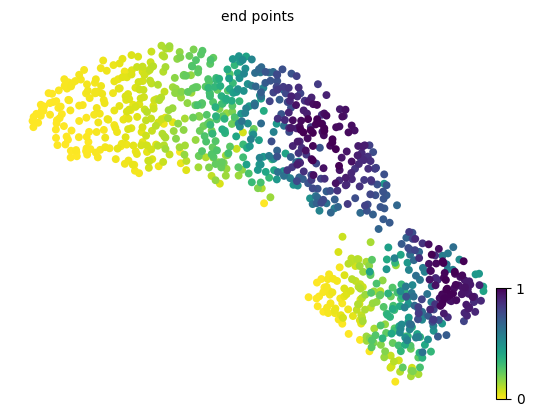

In [71]:
scv.pl.umap(adata, color = 'end_points')

In [12]:
mb.ps.ctrp_simplified(adata, distance_basis='X_pca', groupby = 'timepoints')

(B3)
Eigenvalues:  [1.0000004]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.07089008 0.06071525 0.07077754 ... 0.05844014 0.05609646 0.06278395]
 [0.07534123 0.06275671 0.08043358 ... 0.05608346 0.05337839 0.07202594]
 [0.07533488 0.06270981 0.08037518 ... 0.05607867 0.05338833 0.07201327]
 ...
 [0.06921531 0.05951403 0.06796912 ... 0.05912327 0.05671123 0.05868373]
 [0.0723529  0.07155676 0.0845763  ... 0.05540555 0.05253834 0.07620187]
 [0.07090907 0.06023701 0.07075953 ... 0.05861884 0.05674364 0.06250744]]
(3A2)
Eigenvalues:  [0.99999964]
    identified 1 end points


Trying to set attribute `.obs` of view, copying.


[[0.09666427 0.08930813 0.08971066 ... 0.09636916 0.09729396 0.09055207]
 [0.09652608 0.08970626 0.09088545 ... 0.09632683 0.09601196 0.09135822]
 [0.09666456 0.08991683 0.09094058 ... 0.09593127 0.09557444 0.09172179]
 ...
 [0.09640273 0.09011783 0.09108315 ... 0.09566438 0.09524579 0.091372  ]
 [0.0953636  0.08959269 0.09160996 ... 0.09643217 0.09420864 0.09301664]
 [0.10145781 0.09428348 0.08628817 ... 0.09188068 0.10149655 0.08706891]]


In [64]:
mb.ps.ctrp(adata, self_transitions=False, adata_dist='X_pca', groupby = 'timepoints')

computing terminal states


Trying to set attribute `.obs` of view, copying.


Eigenvalues:  [1.0000021]
(635, 1)
    identified 1 end points (B3)
Dropping absorbing rows for fundamental matrix...
(619, 619)
Calculating fate...
Calculating distances...
Calculating inner product...


Trying to set attribute `.obs` of view, copying.


Eigenvalues:  [0.9999997]
(293, 1)
    identified 1 end points (3A2)
Dropping absorbing rows for fundamental matrix...
(282, 282)
Calculating fate...
Calculating distances...
Calculating inner product...


In [13]:
adata

AnnData object with n_obs × n_vars = 928 × 11490
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'timepoints', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'leiden', 'S_score', 'G2M_score', 'phase', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'ctrp', 'absorbing'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-3A2', 'dropkick_coef-B3', 'gene_count_corr', 'velocity_gamma_B3', 'velocity_r2_B3', 'velocity_genes_B3', 'velocity_gamma_3A2', 'velocity_r2_3A2', 'velocity_genes_3A2'
    uns: 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'phase_colors', 'timepoints_colors', 'umap', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced

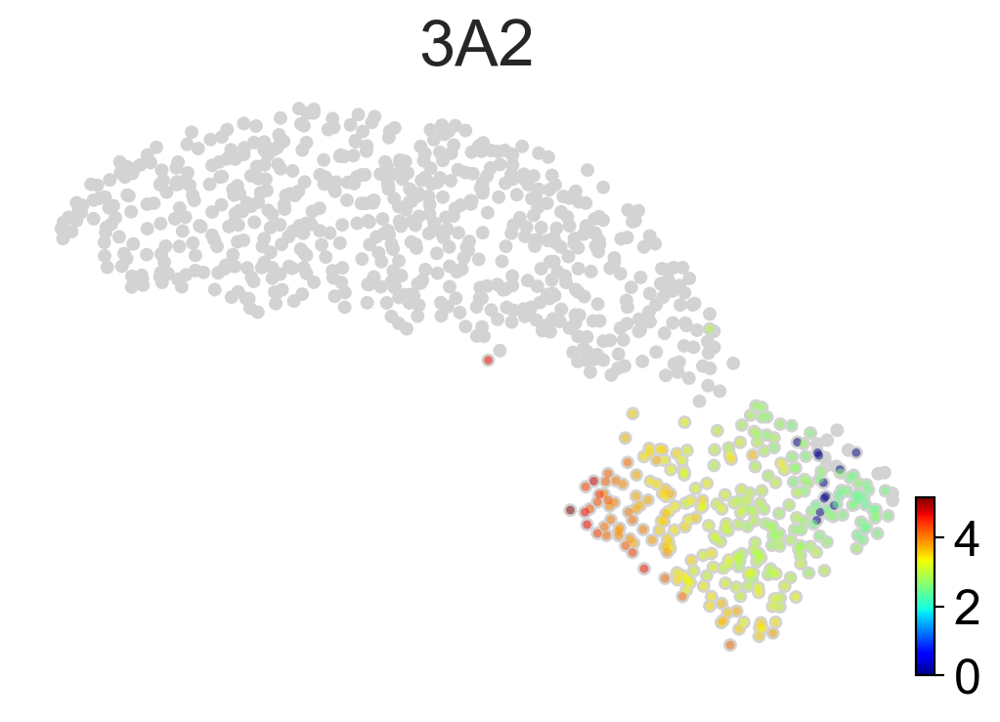

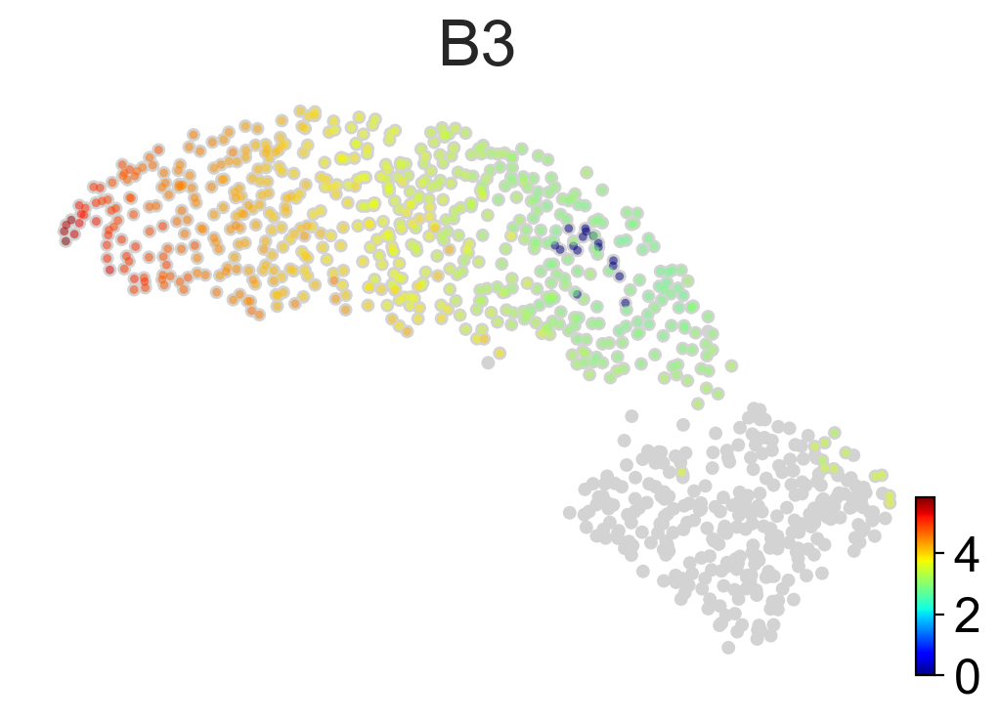

In [14]:
mb.pl.ctrp_groups(adata, groups = 'timepoints', basis = 'umap')


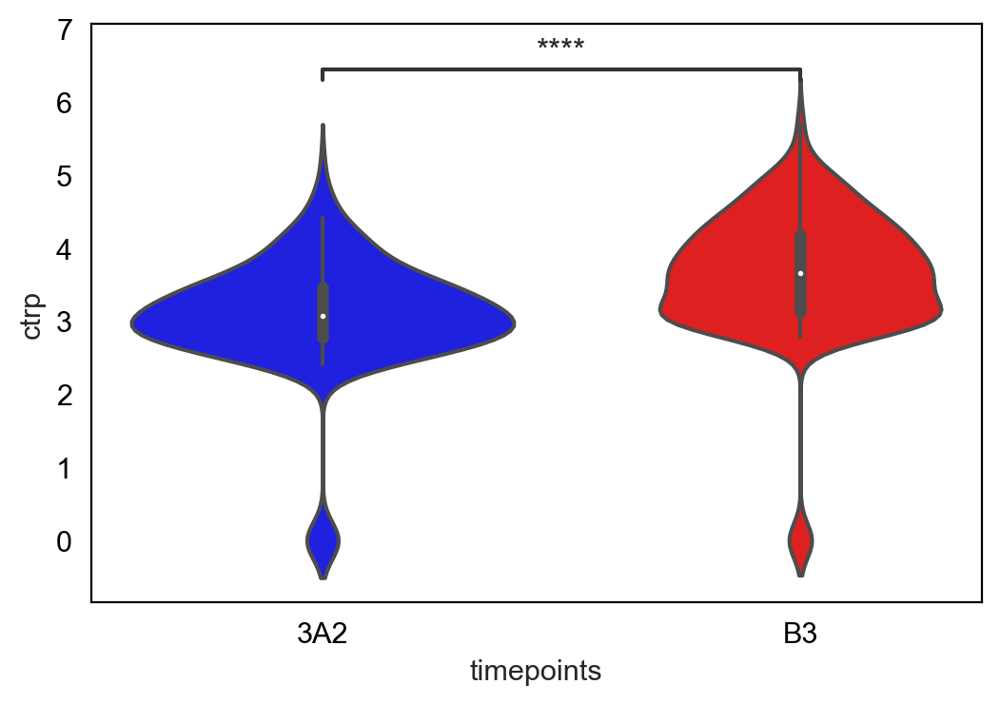

In [20]:
import seaborn as sns
from statannot import add_stat_annotation
plt.figure()
# ax = sns.swarmplot(data = adata.obs, x = 'timepoints', y = 'ctrp', order = ['3A2', 'B3'], palette=['blue','r'])
ax = sns.violinplot(data = adata.obs, x = 'timepoints', y = 'ctrp', order = ['3A2', 'B3'], palette=['blue','r'])

add_stat_annotation(ax, data=adata.obs, x = 'timepoints', y = 'ctrp',
                    box_pairs=[('3A2','B3')],
                         test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
plt.show()

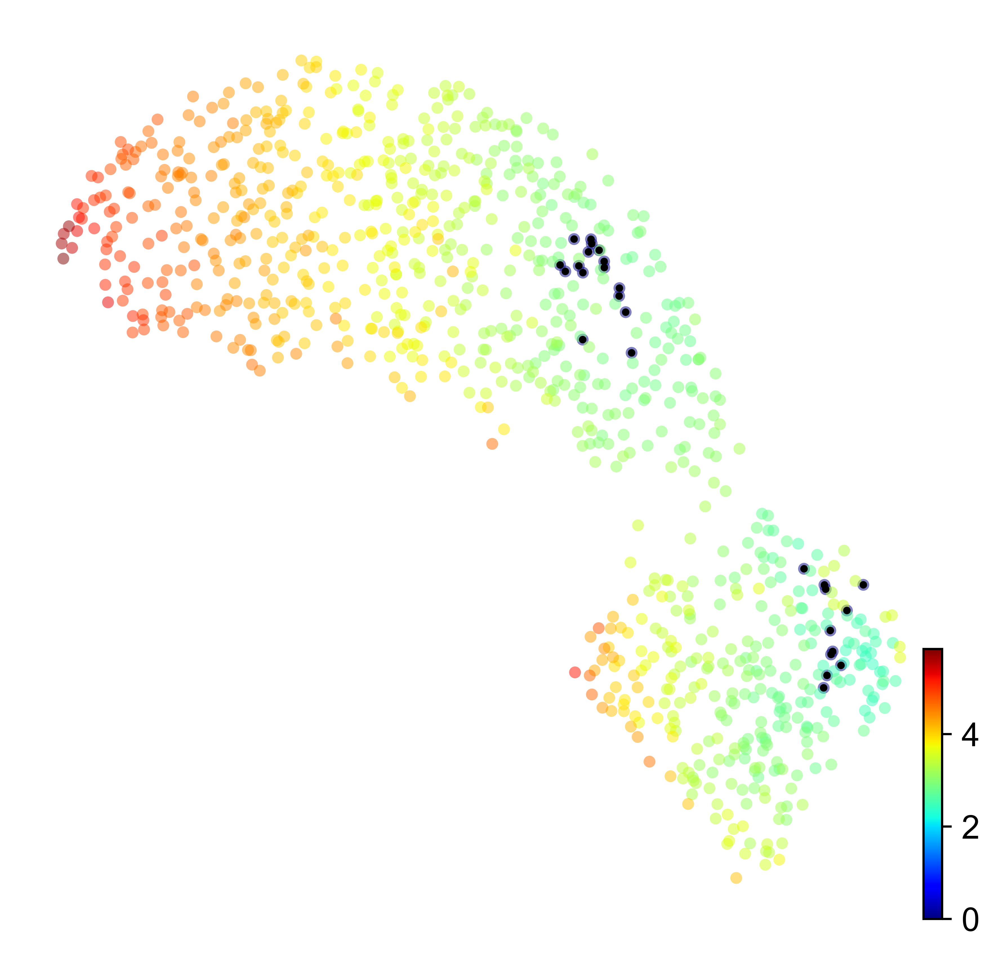

In [17]:
mb.pl.ctrp(adata, basis = 'umap')

In [21]:
adata.write_h5ad('adata04_dk.h5ad')

# Signature Subtyping

Notice that only 40 genes overlap between this data and the signature matrix.

Trying to set attribute `.obs` of view, copying.


Transforming tumor data...
Gene signature matrix now has shape:  (40, 5)
Tumor data shortened to genes in gene list...
(587, 40)
Tumor data subsetting complete.


FileNotFoundError: [Errno 2] No such file or directory: './figures/None/SCLC-A.pdf'

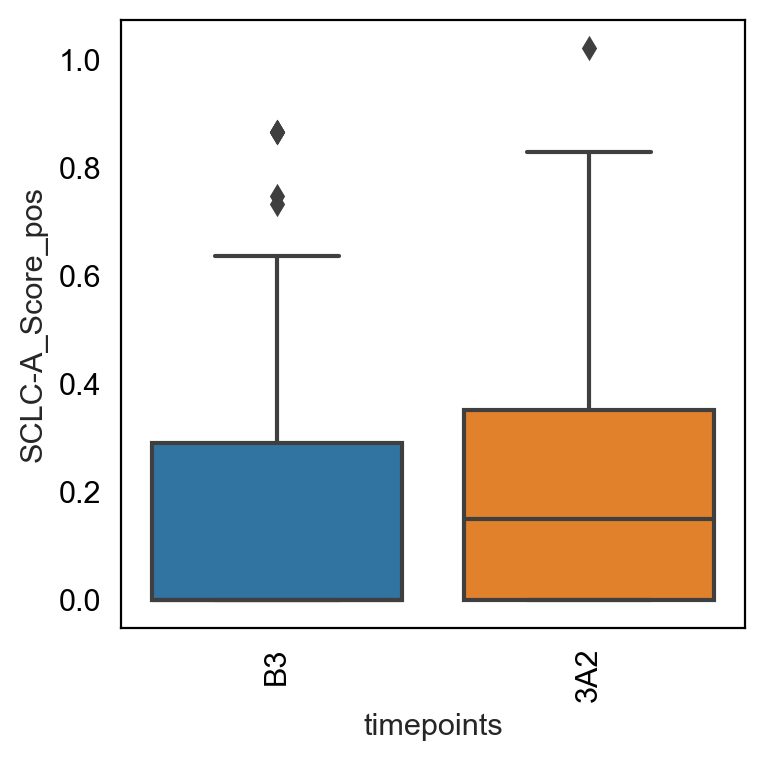

In [22]:
adata, adata_small, sig_matrix2 =mb.ar.phenotyping_recipe(adata, sig_matrix,groupby = 'timepoints', type = 'csr')

In [26]:
adata_small.obs['MYC_expr'] = adata.obs['MYC']
adata_small.obs['MYC_expr'].max()

3.4826882

Index(['SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-A_Score'], dtype='object')


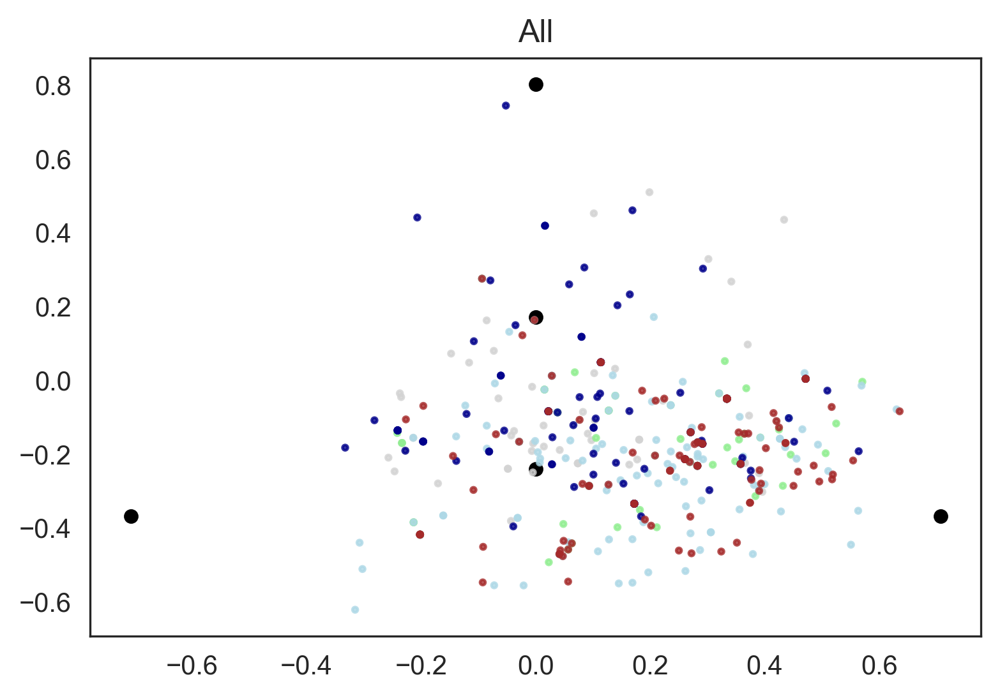

In [44]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
# cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
cp = ['darkblue','lightgreen','brown','lightgrey','lightblue']
# color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
#               'Generalist': 'darkgray', 'None': 'lightgrey'}
color_dict = {'0': cp[4], '1': cp[0], '2': cp[1], '3': cp[2], '4': cp[3],
              '5': 'darkgray', '6': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='leiden',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,vmin = 0,
                        multiplier=1, figsize=(6,4), score_name = '_Score', alpha = .8, s = 4, sizes = 20, vmax = None)



In [45]:
adata

AnnData object with n_obs × n_vars = 928 × 11490
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'timepoints', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'leiden', 'S_score', 'G2M_score', 'phase', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'SCLC-A_Score', 'SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-P_Score', 'SCLC-Y_Score', 'SCLC-A_Score_t1', 'SCLC-A2_Score_t1', 'SCLC-N_Score_t1', 'SCLC-P_Score_t1', 'SCLC-Y_Score_t1', 'Phenotype', 'MYC', 'MYC_expr'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-3A2', 'dropkick_coef-B3', 'gene_count_corr', 'velocity_gamma_B3', 'velocity_r2_B3', 'velocity_genes_B3', 'velocity_gamma_3A2', 'velocity_r2_3A2', 'velocity_genes_3A2', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likeli

<AxesSubplot:xlabel='leiden', ylabel='SCLC-Y_Score'>

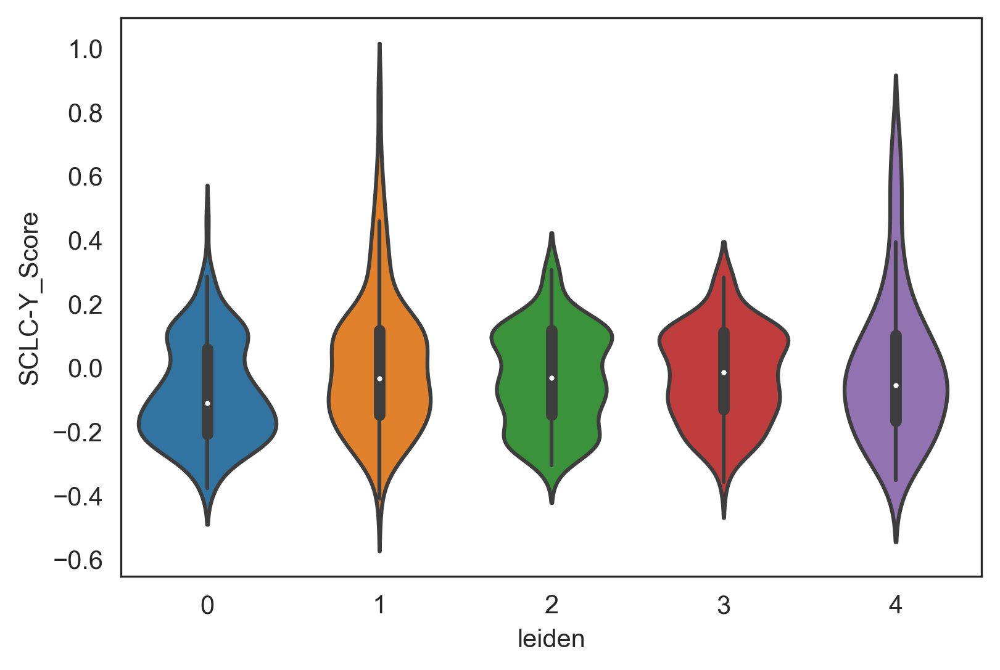

In [49]:
sns.violinplot(data = adata.obs, x = 'leiden', y = 'SCLC-Y_Score')


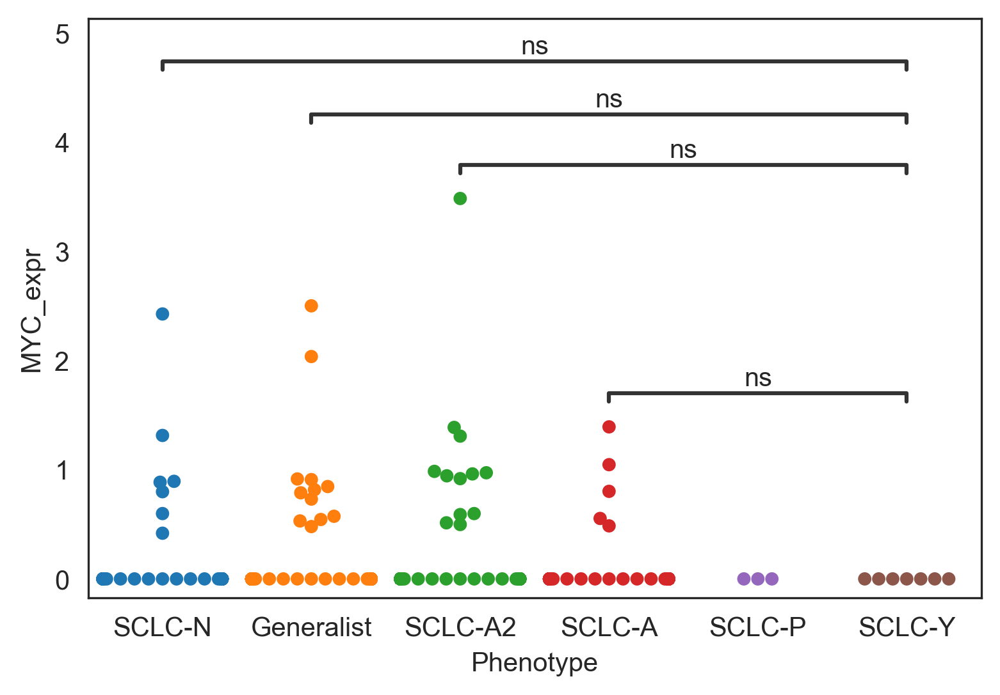

In [37]:
plt.figure()
ax = sns.swarmplot(data = adata.obs, x = 'Phenotype', y = 'MYC_expr')
add_stat_annotation(ax, data=adata.obs, x='Phenotype',y = 'MYC_expr',
                    box_pairs=[('SCLC-Y','SCLC-A'),('SCLC-Y','SCLC-A2'),('SCLC-Y','SCLC-N'),('SCLC-Y','Generalist')],
                         test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
plt.show()

Index(['SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-A_Score'], dtype='object')


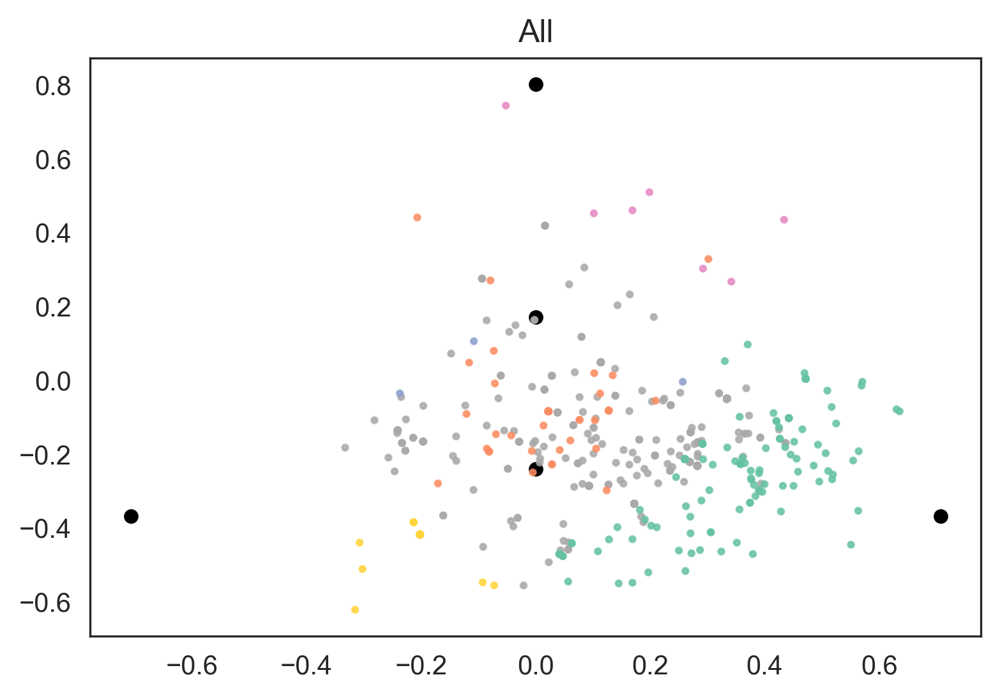

In [14]:

import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='Phenotype',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,
                        multiplier=1, figsize=(6,4), score_name = '_Score', alpha = .8, s = 4, sizes = 20, vmax = None)



<div class="alert alert-block alert-success">
<b>Conclusion:</b> Unfortunately, it is hard to make sense of this picture since only 40/105 genes are found in the data. In general, it seems the samples have a broad mix of cell types, although it's really hard to tell if this is accurate.
</div>

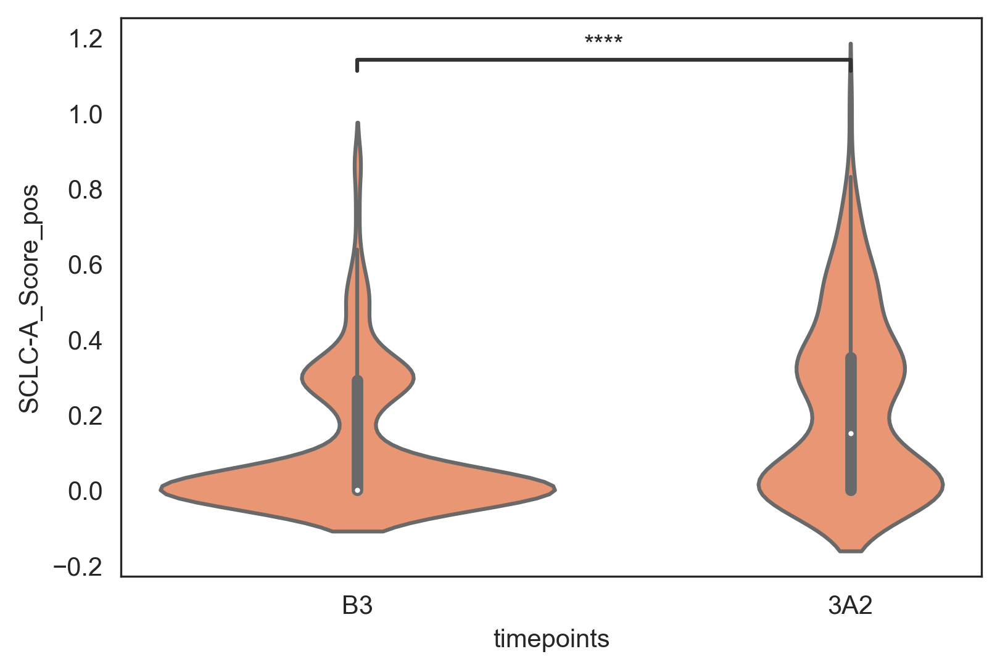

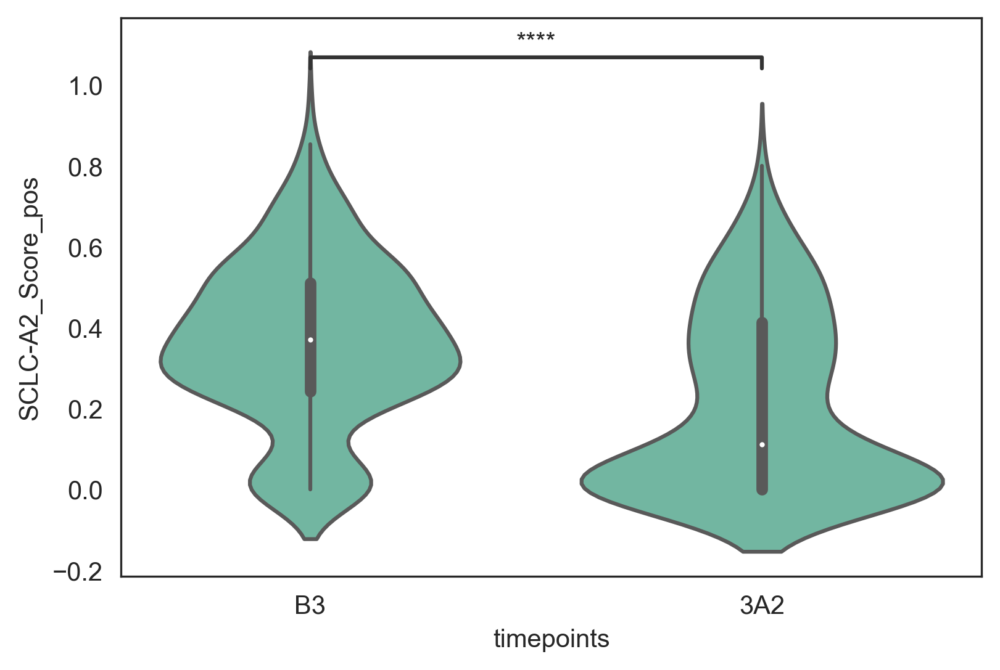

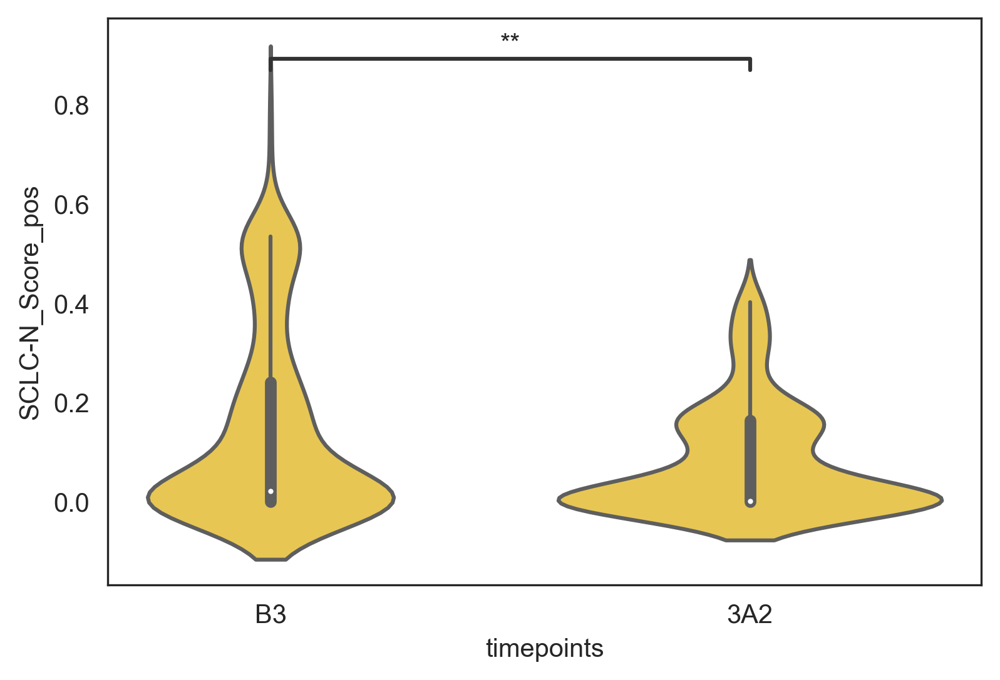

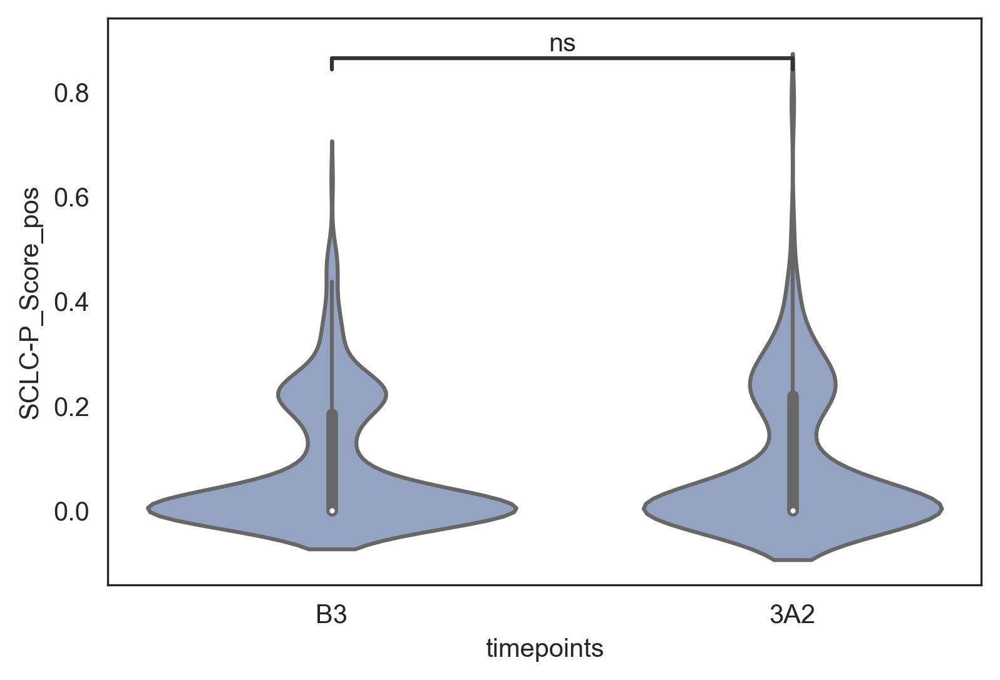

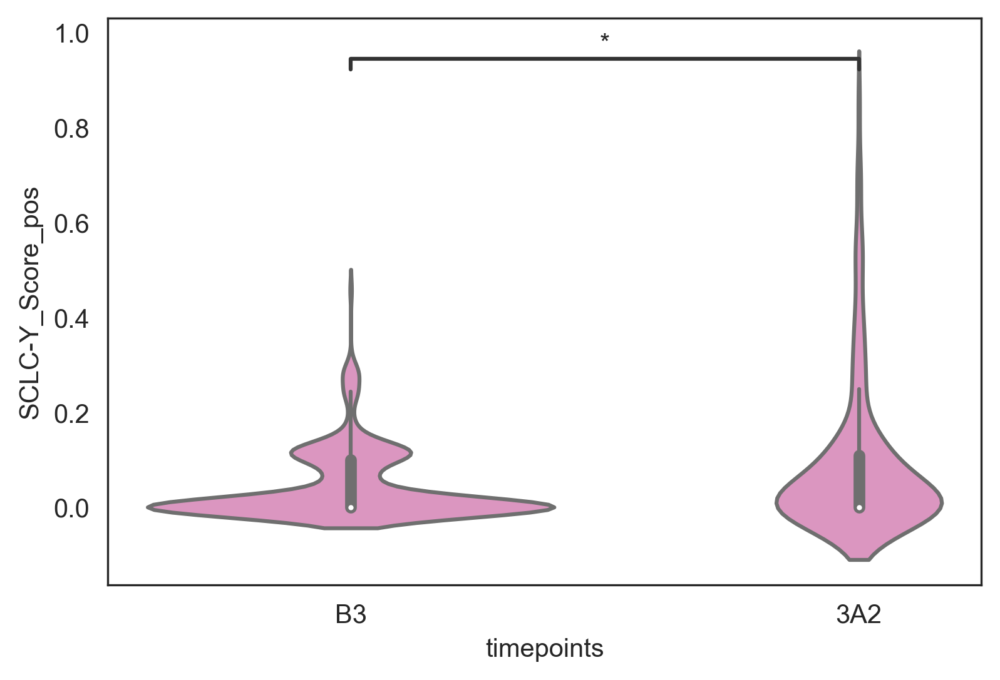

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
subtypes = ['SCLC-A_Score','SCLC-A2_Score','SCLC-N_Score','SCLC-P_Score','SCLC-Y_Score']

for x,i in enumerate(subtypes):
    adata_small.obs[f"{i}_pos"] = adata_small.obs[f"{i}"]*(adata_small.obs[f"{i}"]>0)
    plt.figure()
    ax = sns.violinplot(data = adata_small.obs, x = 'timepoints',y=f"{i}_pos", color = cp[x])
    add_stat_annotation(ax, data=adata_small.obs, x='timepoints',y = f'{i}_pos',
                    box_pairs=[('3A2','B3')],
                         test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
    #     plt.savefig(f"./figures/{i}_htumor.pdf")


<div class="alert alert-block alert-success">
<b>Conclusion:</b> If we do trust the subtyping analysis enough, we find that Y and A cells decrease after treatment, and A2 and N cells increase. This makes sense with the increase in Myc, although I would have thought that Y cells increased too. I have found that NE cell types tend to be lower quality and get filtered out, so I would trust these Y results and do not suspect that Y cells are being filtered too heavily..
</div>

In [42]:
!pip install statannot

In [212]:
import matplotlib.pyplot as plt
import seaborn as sns

In [51]:
from statannot import add_stat_annotation

plt.figure(figsize=(6,4))
ax = sns.boxplot(data = adata_small.obs, x='timepoints',y = 'ctrp',palette = cp)
add_stat_annotation(ax, data=adata_small.obs, x='timepoints',y = 'ctrp',
                    order = sorted(list(set(adata_small.obs['timepoints']))),
                    box_pairs=[('3A2','B3')],
#                               ('SCLC-Y','SCLC-A'), ("SCLC-Y", "SCLC-A2"),
#                                ("SCLC-Y", "SCLC-N"),("SCLC-Y", "SCLC-P"),
#                               ("Generalist", "SCLC-Y")],
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=0)


ValueError: Could not interpret input 'ctrp'

<Figure size 1800x1200 with 0 Axes>

<div class="alert alert-block alert-success">
<b>Conclusion:</b> Regardless of the decrease in Y cells, they still seem to be the most plastic. So story so far: tumor before treatment is highly plastic with a good amount of Y cells. MYC amplification causes the subtypes to shift towards A2 and N, and that seems to actually decrease plasticity a bit. The MYC-high cells that looked like a sink before was probably due to Ben's suspicion of cell cycle arrest (Man he is smart!!).
</div>

**Open questions**
1. Why are the MYC-amplified cells resistant, and do we know they are actually all resistant or just a subset of them? Are they cross-resistant, as Ben suggested they might be?
2. There is movement from the first timepoint towards the second (even though the transitions are independently calculated for each sample). Could this key us in to how cells change from the first timepoint to the second?
3. If we make a network of MYC, could we figure out an intervention to avoid this change?

In [27]:
adata.write_h5ad('../int/pdx/adata05.h5ad')

adata = sc.read_h5ad('../int/pdx/adata05.h5ad')

# Network inference: Imputation of time points

In [57]:
mb.pp.magic_recipe(adata, [i.capitalize() for i in tfs], 'Phenotype_filtered', fname='rpm')


Calculating MAGIC...
  Running MAGIC on 15257 cells and 21163 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 10.95 seconds.
    Calculating KNN search...
    Calculated KNN search in 33.19 seconds.
    Calculating affinities...
    Calculated affinities in 31.84 seconds.
  Calculated graph and diffusion operator in 76.00 seconds.
  Calculating imputation...
  Calculated imputation in 0.08 seconds.
Calculated MAGIC in 83.04 seconds.
Calculating PCA...
Calculated PCA in 9.02 seconds.
Calculating imputation...
Calculated imputation in 0.08 seconds.


# Zooming in on Leiden Cluster 3 for Velocity

In [27]:
adata = sc.read_h5ad('adata03.h5ad')
adata_3=adata[adata.obs.leiden.isin(['3']),:]
adata_3

View of AnnData object with n_obs × n_vars = 146 × 36601
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'timepoints', 'leiden', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-3A2', 'dropkick_coef-B3', 'gene_count_corr', 'velocity_gamma_B3', 'velocity_r2_B3', 'velocity_genes_B3', 'velocity_gamma_3A2', 'velocity_r2_3A2', 'velocity_genes_3A2', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'timepoints_colors', 'umap', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'velocity'
    obsp: 'connectivities', 'distances'

In [85]:
sc.tl.pca(adata_3)
sc.pp.neighbors(adata_3)
sc.tl.umap(adata_3)
sc.tl.leiden(adata_3,0.6)

In [86]:
scv.pp.moments(adata_3)
scv.tl.velocity(adata_3, mode = 'deterministic',groupby='timepoints')
scv.tl.velocity_graph(adata_3)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [89]:
scv.tl.terminal_states(adata_3, groupby='timepoints')

computing terminal states
    identified 1 region of root cells and 1 region of end points  (B3).
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


In [108]:
sc.set_figure_params( dpi=100, dpi_save=150, frameon=None, vector_friendly=True, transparent=True, fontsize=12, figsize=None, color_map=None, facecolor=None, format='pdf', ipython_format='png2x')

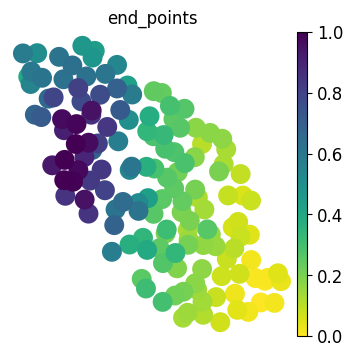

In [109]:
sc.pl.umap(adata_3, color="end_points")

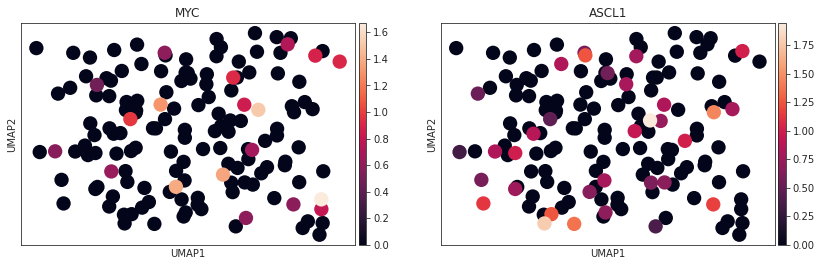

In [28]:
sc.pl.umap(adata_3, color=['MYC','ASCL1'])

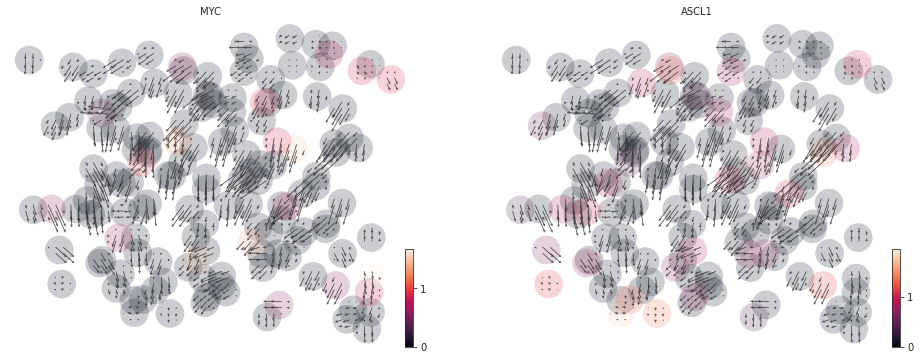

In [29]:
scv.pl.velocity_embedding_grid(adata_3, basis = 'umap', figsize = (8,6), legend_loc = 'on right',color = ['MYC', 'ASCL1'])


In [32]:
scv.tl.recover_dynamics(adata)

recovering dynamics
    finished (0:02:37) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [33]:
scv.tl.latent_time(adata, vkey = 'velocity')

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


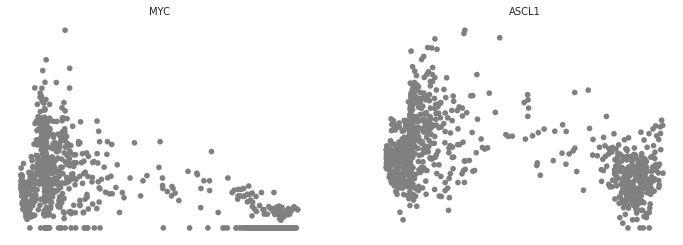

In [36]:
scv.pl.scatter(adata, x='latent_time', y= ['MYC','ASCL1'], frameon=False)

In [95]:
adata_3

AnnData object with n_obs × n_vars = 146 × 36601
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'timepoints', 'leiden', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'dropkick_coef-3A2', 'dropkick_coef-B3', 'gene_count_corr', 'velocity_gamma_B3', 'velocity_r2_B3', 'velocity_genes_B3', 'velocity_gamma_3A2', 'velocity_r2_3A2', 'velocity_genes_3A2', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'timepoints_colors', 'umap', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'velocity'
    obsp: 'connectivities', 'distances'

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


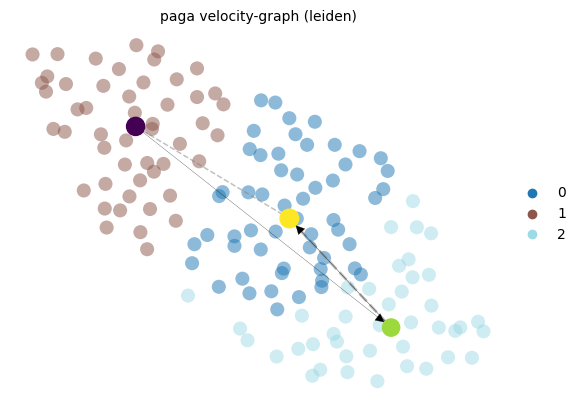

In [98]:
mb.ps.velocity_paga(adata_3, basis='umap', color='MYC')

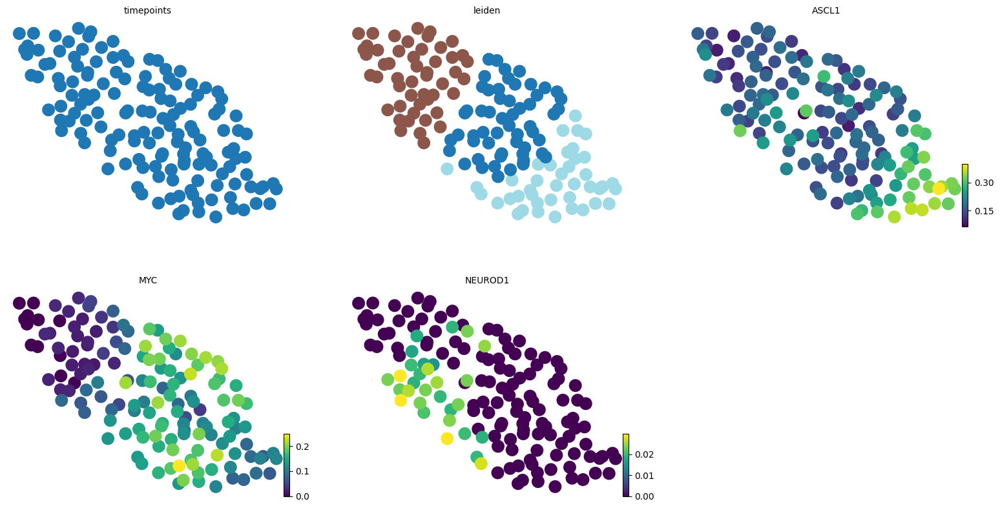

In [99]:
scv.pl.umap(adata_3, color = ['timepoints','leiden','ASCL1','MYC', 'NEUROD1'], ncols = 3, smooth = True)